In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import tensorflow as tf
import plotly.express as px
from IPython.display import clear_output
tf.random.set_seed(666)

Cargamos los datos MNIST

In [2]:
(Xtrain, Ytrain), (Xtest, Ytest) = tf.keras.datasets.mnist.load_data()
Xtrain.shape, Ytrain.shape, Xtest.shape, Ytest.shape

((60000, 28, 28), (60000,), (10000, 28, 28), (10000,))

Visualizamos algunas imágenes

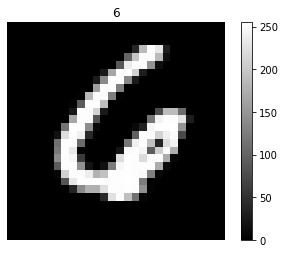

In [3]:
plt.figure()
sample = np.random.randint(Xtrain.shape[0])
plt.imshow(Xtrain[sample], cmap="gray")
plt.colorbar()
plt.title(Ytrain[sample])
plt.axis("off")
plt.show()

Normalizmaos para que los valores estén entre 0 y 1.

In [4]:
Xtrain = Xtrain / 255
Xtest = Xtest / 255

Hacemos un reshape para que las imágenes entren en la red neuronal con dimensión (,784). También podría resolverse con una capa flatten al principio de la red, pero no está bin visto.

In [5]:
Xtrain = Xtrain.reshape(Xtrain.shape[0], -1)
Xtest = Xtest.reshape(Xtest.shape[0], -1)

Ahora tenemos 60000 imágenes de tamaño 784.

In [6]:
Xtrain.shape

(60000, 784)

Vemos cómo son ahora las imágenes

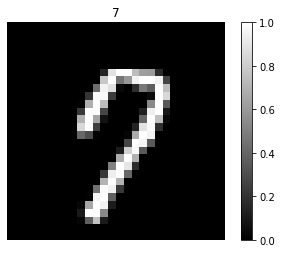

In [7]:
plt.figure()
sample = np.random.randint(X_train.shape[0])
plt.imshow(X_train[sample].reshape((28,28)), cmap="gray")
plt.colorbar()
plt.title(Ytrain[sample])
plt.axis("off")
plt.show()

Crear un objeto Dataset de tensorflow a partir de numpy nos ayudará a que todo se ejecute más rápidamente.

In [8]:
#Con el conjunto de train 
train_dataset = tf.data.Dataset.from_tensor_slices(Xtrain)
train_dataset = train_dataset.shuffle(buffer_size=1024).batch(64)

#Con el conjunto de test
test_dataset = tf.data.Dataset.from_tensor_slices(Xtest)
test_dataset = test_dataset.shuffle(buffer_size=1024).batch(64)

#Comprobamos las dimensiones de los objetos.
aux = []
for a in train_dataset:
    aux.append(a)
print(np.vstack(aux).shape)
print(len(aux))

(60000, 784)
938


# Creación de clases.

Pese a que hay varias formas de crear un autoencoder, vamos a decantarnos por las clases creadas a partir de Sequentials.

## AutoEncoder con capas densas. (relu)

Lo habitual es que el AutoEncoder funcione a partir de capas convolucionales, pero como primera aproximación y para familiarizarnos con el funcionamiento, utilizaremos capas densas. Todas las capas tendrán **relus** como funciones de activación.

In [9]:
class AutoEncoder_relu(tf.keras.Model):
    """
    AutoEncoder con capas densas.
    """
    def __init__(self, input_shape, latent_dim):
        """
        Parameters
        ----------
        input_shape: int
            Tamaño de las imágenes después del flatten.
        latent_dim: int
            Dimensión del espacio latente.
        """
        super(AutoEncoder_relu, self).__init__() #Hereda todos los métodos de tf.keras.Model
        
        #Creamos el modelo secuencial para el encoder.
        #El encoder cuenta también con la capa del espacio latente.
        self.encoder = tf.keras.models.Sequential([
            tf.keras.layers.Dense(128, activation = "relu", input_shape=(input_shape,)),
            tf.keras.layers.Dense(64, activation = "relu"),
            tf.keras.layers.Dense(32, activation = "relu"),
            tf.keras.layers.Dense(latent_dim, activation = "relu")
        ])
        
        #Creamos el modelo secuencial para el decoder.
        self.decoder = tf.keras.models.Sequential([
            tf.keras.layers.Dense(32, activation = "relu", input_shape=(latent_dim,)),
            tf.keras.layers.Dense(64, activation = "relu"),
            tf.keras.layers.Dense(128, activation = "relu"),
            tf.keras.layers.Dense(input_shape, activation = "relu")
        ])
    
    
    def call(self, X):
        """
        La función call es lo que define el funcionamiento de la clase, es decir, 
        qué camino han de llevar los datos desde que entran a la clase hasta que salen.
        
        Es lo que se ejecuta cuando hacemos <modelo(x)>
        
        Return
        ---------
        Imagen decodificada.
        """
        encoded = self.encoder(X)
        decoded = self.decoder(encoded)
        return decoded    

In [10]:
#Definimos el modelo
ae = AutoEncoder_relu(input_shape=Xtrain.shape[1], latent_dim=2)

Realizamos la primera prueba a ver si funciona correctamente. Tomamos una imagen -por ejemplo la última del dataset-. Es necesario hacerle un reshape para mostrarla porque anteriormente la habíamos estirado.

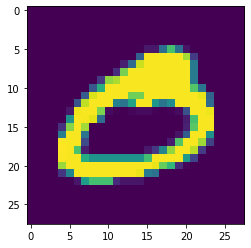

In [11]:
plt.imshow(a[-1].numpy().reshape((28,28)))
plt.show()

Y antes de pasar esta imagen, debemos expandir las dimensiones porque la clase espera la imágen acompañada del tamaño del batch. Si solo queremos pasarle una imagen, debemos añadirle la dimensión fantasma.

In [12]:
#Expandimos la dimensión de la imagen a
tf.expand_dims(a[-1],0).shape
#Pasaremos una imagen de 784

TensorShape([1, 784])

In [13]:
#Pasamos la imagen expandida a por el AutoEncoder
a_dec = ae(tf.expand_dims(a[-1],0))
a_dec.shape
#Y nos devolverá una imagen de 784

TensorShape([1, 784])

Vamos ahora a representar gráficamente la decodificación de la imágen a

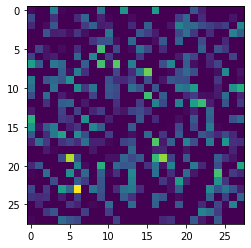

In [14]:
plt.imshow(a_dec[-1].numpy().reshape((28,28)))
plt.show()

Evidentemente, es ruido generado por un modelo que aún no está entrenado.

Para ver el summary de las capas, teniendo en cuenta que están encapsuladas por un lado en el encodr y por otro en el decoder con sendos sequential, hay varias instrucciones para según qué información queramos.

In [15]:
ae.summary()

Model: "auto_encoder_relu"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential (Sequential)      (None, 2)                 110882    
_________________________________________________________________
sequential_1 (Sequential)    (None, 784)               111664    
Total params: 222,546
Trainable params: 222,546
Non-trainable params: 0
_________________________________________________________________


In [16]:
ae.encoder.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 128)               100480    
_________________________________________________________________
dense_1 (Dense)              (None, 64)                8256      
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 66        
Total params: 110,882
Trainable params: 110,882
Non-trainable params: 0
_________________________________________________________________


In [17]:
ae.decoder.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 32)                96        
_________________________________________________________________
dense_5 (Dense)              (None, 64)                2112      
_________________________________________________________________
dense_6 (Dense)              (None, 128)               8320      
_________________________________________________________________
dense_7 (Dense)              (None, 784)               101136    
Total params: 111,664
Trainable params: 111,664
Non-trainable params: 0
_________________________________________________________________


## Entrenando el modelo



In [18]:
#Seleccionamos el optimizador y la función de pérdida
ae.compile(optimizer="adam", loss = "mean_squared_error")

In [19]:
history = ae.fit(Xtrain, Xtrain, 
                           epochs = 50, 
                           batch_size = 64, 
                           shuffle = True, 
                           validation_data=(Xtest, Xtest))

Epoch 1/50
938/938 [==============================] - 6s 6ms/step - loss: 0.0694 - val_loss: 0.0541
Epoch 2/50
938/938 [==============================] - 5s 5ms/step - loss: 0.0499 - val_loss: 0.0479
Epoch 3/50
938/938 [==============================] - 5s 5ms/step - loss: 0.0469 - val_loss: 0.0462
Epoch 4/50
938/938 [==============================] - 5s 5ms/step - loss: 0.0446 - val_loss: 0.0440
Epoch 5/50
938/938 [==============================] - 6s 6ms/step - loss: 0.0430 - val_loss: 0.0425
Epoch 6/50
938/938 [==============================] - 5s 6ms/step - loss: 0.0422 - val_loss: 0.0418
Epoch 7/50
938/938 [==============================] - 5s 6ms/step - loss: 0.0418 - val_loss: 0.0414
Epoch 8/50
938/938 [==============================] - 5s 5ms/step - loss: 0.0411 - val_loss: 0.0407
Epoch 9/50
938/938 [==============================] - 5s 5ms/step - loss: 0.0406 - val_loss: 0.0403
Epoch 10/50
938/938 [==============================] - 5s 5ms/step - loss: 0.0404 - val_loss: 0.0406

Comprobamos que funciona correctamente el entrenamiento y que funciona de manera similar tanto en train como en test.

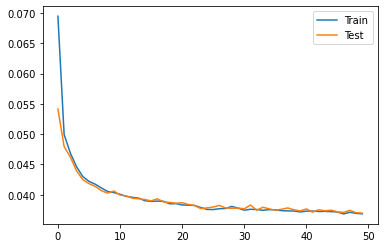

In [20]:
plt.figure()
plt.plot(history.history["loss"], label="Train")
plt.plot(history.history["val_loss"], label="Test")
plt.legend()
plt.show()

Una vez entrenado el AutoEncoder y teniendo separado el encoder del decoder, podemos acceder directamente al espacio latente para ver cómo es.

In [21]:
#Codificamos todo los datos de train y los pintamos en función de su etiqueta
latent = ae.encoder(Xtrain)
latent_df = pd.DataFrame(latent)
latent_df["label"] = Ytrain.astype(str)

In [22]:
px.scatter(latent_df, x = 0, y = 1, color = "label",
          category_orders={"label": ["1", "2", "3", "4", "5", "6", "7", "8", "9"]})

Pero este espacio latente tiene varios problemas, ni está centrado, ni está normalizado. Para arreglar el problema, bastará con cambiar la función de activación de la capa del espacio lantente. Cambiaremos la ReLu por una tanh. Debido a la ReLu anterior, los valores del espacio latente tienen rango $[0,\infty]$

Ahora veamos una reconstrucción de una imagen del dataset:

In [25]:
a_dec = ae(tf.expand_dims(a[-1],0))

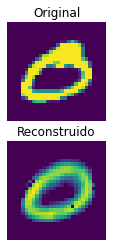

In [26]:
plt.figure()
plt.subplot(2,1,1)
plt.title("Original")
plt.imshow(a[-1].numpy().reshape((28,28)))
plt.axis("off")

plt.subplot(2,1,2)
plt.title("Reconstruido")
plt.imshow(a_dec[-1].numpy().reshape((28,28)))
plt.axis("off")

plt.show()

## AutoEncoder con capas densas. (tanh)

In [32]:
class AutoEncoder_tanh(tf.keras.Model):
    """
    AutoEncoder con capas densas.
    """
    def __init__(self, input_shape, latent_dim):
        """
        Parameters
        ----------
        input_shape: int
            Tamaño de las imágenes después del flatten.
        latent_dim: int
            Dimensión del espacio latente.
        """
        super(AutoEncoder_tanh, self).__init__() #Hereda todos los métodos de tf.keras.Model
        
        #Creamos el modelo secuencial para el encoder
        self.encoder = tf.keras.models.Sequential([
            tf.keras.layers.Dense(128, activation = "relu", input_shape=(input_shape,)),
            tf.keras.layers.Dense(64, activation = "relu"),
            tf.keras.layers.Dense(32, activation = "relu"),
            tf.keras.layers.Dense(latent_dim, activation = "tanh")
        ])
        
        self.decoder = tf.keras.models.Sequential([
            tf.keras.layers.Dense(32, activation = "relu", input_shape=(latent_dim,)),
            tf.keras.layers.Dense(64, activation = "relu"),
            tf.keras.layers.Dense(128, activation = "relu"),
            tf.keras.layers.Dense(input_shape, activation = "relu")
        ])
    
    def call(self, X):
        encoded = self.encoder(X)
        decoded = self.decoder(encoded)
        return decoded    

In [33]:
ae_tanh = AutoEncoder_tanh(input_shape=Xtrain.shape[1], latent_dim=2)
ae_tanh.compile(optimizer="adam", loss = "mean_squared_error")

In [34]:
history_tanh = ae_tanh.fit(Xtrain, Xtrain, 
                           epochs = 50, 
                           batch_size = 64, 
                           shuffle = True, 
                           validation_data=(Xtest, Xtest))

Epoch 1/50
938/938 [==============================] - 6s 6ms/step - loss: 0.0607 - val_loss: 0.0502
Epoch 2/50
938/938 [==============================] - 5s 5ms/step - loss: 0.0478 - val_loss: 0.0455
Epoch 3/50
938/938 [==============================] - 5s 6ms/step - loss: 0.0442 - val_loss: 0.0426
Epoch 4/50
938/938 [==============================] - 5s 6ms/step - loss: 0.0419 - val_loss: 0.0414
Epoch 5/50
938/938 [==============================] - 5s 5ms/step - loss: 0.0410 - val_loss: 0.0404
Epoch 6/50
938/938 [==============================] - 5s 6ms/step - loss: 0.0402 - val_loss: 0.0399
Epoch 7/50
938/938 [==============================] - 5s 6ms/step - loss: 0.0398 - val_loss: 0.0399
Epoch 8/50
938/938 [==============================] - 5s 6ms/step - loss: 0.0394 - val_loss: 0.0393
Epoch 9/50
938/938 [==============================] - 5s 6ms/step - loss: 0.0391 - val_loss: 0.0392
Epoch 10/50
938/938 [==============================] - 5s 6ms/step - loss: 0.0389 - val_loss: 0.0394

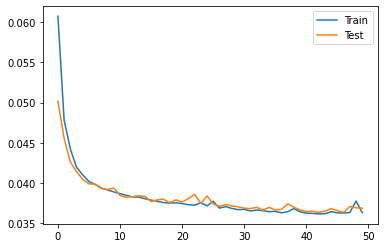

In [35]:
plt.figure()
plt.plot(history_tanh.history["loss"], label="Train")
plt.plot(history_tanh.history["val_loss"], label="Test")
plt.legend()
plt.show()

In [36]:
#Codificamos todos los datos de train y los pintamos en función de su etiqueta
latent_tanh = ae_tanh.encoder(Xtrain)
latent_df = pd.DataFrame(latent_tanh)
latent_df["label"] = Ytrain.astype(str)

In [37]:
px.scatter(latent_df, x = 0, y = 1, color = "label",
          category_orders={"label": ["1", "2", "3", "4", "5", "6", "7", "8", "9"]})

Ahora el espacio latente está centrado.

Ahora veamos una reconstrucción de una imagen del dataset:

In [38]:
a_dec = ae_tanh(tf.expand_dims(a[-1],0))

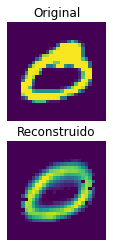

In [39]:
plt.figure()
plt.subplot(2,1,1)
plt.title("Original")
plt.imshow(a[-1].numpy().reshape((28,28)))
plt.axis("off")

plt.subplot(2,1,2)
plt.title("Reconstruido")
plt.imshow(a_dec[-1].numpy().reshape((28,28)))
plt.axis("off")

plt.show()

## AutoEncoder con capas convolucionales

In [42]:
class AutoEncoder_conv(tf.keras.Model):
    """
    AutoEncoder con capas densas.
    """
    def __init__(self, input_shape, latent_dim):
        """
        Parameters
        ----------
        input_shape: int
            Tamaño de las imágenes después del flatten.
        latent_dim: int
            Dimensión del espacio latente.
        """
        super(AutoEncoder_conv, self).__init__() #Hereda todos los métodos de tf.keras.Model
        
        #Creamos el modelo secuencial para el encoder
        self.encoder = tf.keras.models.Sequential([
            tf.keras.layers.Conv2D(28, (3,3), activation = "relu", input_shape=(input_shape,)),
            tf.keras.layers.Conv2D(14, (3,3), activation = "relu"),
            tf.keras.layers.Conv2D(7, (3,3), activation = "relu"),
            tf.keras.layers.Dense(latent_dim, activation = "tanh")
        ])
        
        self.decoder = tf.keras.models.Sequential([
            tf.keras.layers.Conv2DTran(7,(3,3), activation = "relu", input_shape=(latent_dim,)),
            tf.keras.layers.Conv2DTran(14,(3,3), activation = "relu"),
            tf.keras.layers.Conv2DTran(28,(3,3), activation = "relu"),
            tf.keras.layers.Dense(input_shape, activation = "relu")
        ])
    
    def call(self, X):
        encoded = self.encoder(X)
        decoded = self.decoder(encoded)
        return decoded    

In [43]:
ae_conv = AutoEncoder_conv(input_shape=Xtrain.shape[1], latent_dim=2)
ae_conv.compile(optimizer="adam", loss = "mean_squared_error")

ValueError: Input 0 of layer conv2d_3 is incompatible with the layer: : expected min_ndim=4, found ndim=2. Full shape received: (None, 784)